In [ ]:
!pip install audonnx audinterface audb audmetric

In [ ]:
!zip -r test_case.zip audios model transcriptions
# !unzip test.zip

  adding: audios/ (stored 0%)
  adding: audios/out-3003958667-994-20240405-163905-1712353145.162469.WAV (deflated 38%)
  adding: audios/.ipynb_checkpoints/ (stored 0%)
  adding: model/ (stored 0%)
  adding: model/.ipynb_checkpoints/ (stored 0%)
  adding: model/emotion_classifier_v2.pkl (deflated 3%)
  adding: transcriptions/ (stored 0%)
  adding: transcriptions/out-3003958667-994-20240405-163905-1712353145.162469.txt (deflated 59%)
  adding: transcriptions/.ipynb_checkpoints/ (stored 0%)


In [23]:
import librosa
import soundfile
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score

import joblib

import re
import os
from glob import glob
from pathlib import Path
from scipy.io import wavfile # to read and write audio files
from io import BytesIO
import audiofile


In [29]:
from IPython.display import Audio
import IPython.display as ipd
from scipy.io import wavfile # to read and write audio files
import re
import os
from glob import glob
import numpy as np
import matplotlib.pyplot as plt


# Function to convert time string to seconds
def time_to_seconds(time_str):
    parts = list(map(int, re.split('[:]', time_str)))
    return parts[0] * 3600 + parts[1] * 60 + parts[2]

def PlayAudioSegment(filepath, start, end, channel='none'):

    # get sample rate and audio data
    sample_rate, audio_data = wavfile.read(filepath) # where filepath = 'directory/audio.wav'

    #get length in minutes of audio file
    print('duration: ', audio_data.shape[0] / sample_rate / 60,'min')

    ## splice the audio with prefered start and end times
    # spliced_audio = audio_data[start * sample_rate : end * sample_rate, :]
    spliced_audio = audio_data[int(start * sample_rate) : int(end * sample_rate)]

    ## choose left or right channel if preferred (0 or 1 for left and right, respectively; or leave as a string to keep as stereo)
    spliced_audio = spliced_audio[:,channel] if type(channel)==int else spliced_audio

    ## playback natively with IPython; shape needs to be (nChannel,nSamples)
    return ipd.display(ipd.Audio(spliced_audio.T, rate=sample_rate))

def play_interval(timestamp:dict, key:str, interval_number:int):

  interval = timestamp[key][interval_number]
  start, end = map(time_to_seconds, re.split('[-]', interval))
  duration = end - start
  print(f"Playing interval: {interval_number} of transcript id: '{key}'...")


  # Get audio file with dict key
  base = os.path.abspath('')
  file_paths_wav = glob(f"{audio_path}/*.WAV")
  # input_files_wav = [os.path.basename(file_path) for file_path in file_paths_wav]
  # for wav in input_files_wav:
  for wav in file_paths_wav:
    # command = f"ffmpeg -y -i {wav} -acodec pcm_s16le -ar 44100 dummy.wav"
    # os.system(command)
    if wav.endswith(f"{key}.WAV"):
      print(os.path.basename(wav))

      PlayAudioSegment(wav, start, end, channel='none')


def plot_waveform_from_array(audio_data, sample_rate, audio_path):
    # Calculate the time array
    time = np.arange(0, len(audio_data)) / sample_rate

    # Create a figure with two subplots
    fig, axes = plt.subplots(1, 2, figsize=(7, 2))

    # Plot the main waveform using librosa
    librosa.display.waveshow(audio_data, sr=sample_rate, ax=axes[0])
    axes[0].set_title('Main Audio')
    axes[0].set_xlabel('Time (s)')
    axes[0].set_ylabel('Amplitude')

    # Comparision data with the train dataset
    y, sr = librosa.load(audio_path, sr=None)
    librosa.display.waveshow(y, sr=sr, ax=axes[1])
    axes[1].set_title('Comparison Audio')
    axes[1].set_xlabel('Time (s)')
    axes[1].set_ylabel('Amplitude')

    plt.show()


In [25]:

# Extract features (mfcc, chroma, mel) from a sound array
def extract_sarray_feature(sound_array, sample_rate, mfcc, chroma, mel):
    if chroma:
        stft = np.abs(librosa.stft(sound_array))
    result = np.array([])
    if mfcc:
        mfccs = np.mean(librosa.feature.mfcc(y=sound_array, sr=sample_rate, n_mfcc=40).T, axis=0)
        result = np.hstack((result, mfccs))
    if chroma:
        chroma = np.mean(librosa.feature.chroma_stft(S=stft, sr=sample_rate).T, axis=0)
        result = np.hstack((result, chroma))
    if mel:
        mel = np.mean(librosa.feature.melspectrogram(y=sound_array, sr=sample_rate).T, axis=0)
        result = np.hstack((result, mel))

    return result

In [26]:
# @title Divide the audios using the speaker timestamps, to analize specific fragments of audio

# OS BASED PATH
# All files and directories ending with .txt and that don't begin with a dot:
# ROOT = os.path.dirname(__file__)
ROOT = os.path.abspath('')

audio_path = os.path.join(ROOT, 'audios')
transcribe_path = os.path.join(ROOT, 'transcriptions')
model_path = os.path.join(ROOT, 'model')

file_paths = glob(f"{transcribe_path}/*.txt")
input_files = [os.path.basename(file_path) for file_path in file_paths]

# Load / Run the pretrained model
model_file = os.path.join(model_path,'emotion_classifier_v2.pkl')
clf = joblib.load(model_file) # loading the model file from the storage

# Preprocess input transcription files
# Speaker dicts
speakers0_times = {}
speakers1_times = {}
speakers0_dict = {}
speakers1_dict = {}

for numero_diar, input_file in enumerate(input_files):
  input_file = os.path.join(transcribe_path, input_file)
  with open(input_file, "r", encoding="UTF-8") as f:
      transcribe = f.readlines()

  # Extract the last 6 digits from the file name
  if len(input_file.split('.')) > 2:
    id_file = input_file.split('.')[1]
  else:
    id_file = input_file.split('.')[-2][-6:]

  # Keyword preprocessing
  speaker0 = [line for line in transcribe if "SPEAKER_00" in line]
  speaker1 = [line for line in transcribe if "SPEAKER_01" in line]

  # Join the lines of each speaker
  speaker0 = " ".join(speaker0)
  speaker1 = " ".join(speaker1)

  # Save the timestamps of talking of each speaker
  pattern = r"\d{1,2}:\d{2}:\d{2} - \d{1,2}:\d{2}:\d{2} \[SPEAKER_00]:"
  speaker0_tmp = re.findall(pattern, speaker0)
  speaker0_tmp = [timestamp.replace(" [SPEAKER_00]:", "") for timestamp in speaker0_tmp]
  speakers0_times[id_file] = speaker0_tmp

  pattern = r"\d{1,2}:\d{2}:\d{2} - \d{1,2}:\d{2}:\d{2} \[SPEAKER_01]:"
  speaker1_tmp = re.findall(pattern, speaker1)
  speaker1_tmp = [timestamp.replace(" [SPEAKER_01]:", "") for timestamp in speaker1_tmp]
  speakers1_times[id_file] = speaker1_tmp

  # Remove the strings that match the pattern 00:00:00 - 0:00:26 [SPEAKER_00]:
  pattern = r"\d{1,2}:\d{2}:\d{2} - \d{1,2}:\d{2}:\d{2} \[SPEAKER_\d{2}\]:"
  # Save the lines without timestamp
  speaker0 = re.sub(pattern, "", speaker0)
  speaker1 = re.sub(pattern, "", speaker1)

  speaker0 = speaker0.split("\n")
  speaker1 = speaker1.split("\n")
  speakers0_dict[id_file] = speaker0
  speakers1_dict[id_file] = speaker1


# Function to predict emotion from audio features
def predict_emotion(features, clf):
    # model = joblib.load(clf) # loading the model file from the storage

    predicted_emotion=clf.predict(features)

    return predicted_emotion

# Function to convert time string to seconds
def time_to_seconds(time_str):
    parts = list(map(int, re.split('[:]', time_str)))
    return parts[0] * 3600 + parts[1] * 60 + parts[2]

correct = []
def emotions_per_speaker(speaker_times:dict):
  # All the wavs present in the audio_path
  file_paths_wav = glob(f"{audio_path}/*.WAV")

  audio_paths_dict = {file_path.split('.')[1] if len(file_path.split('.')) > 2 else file_path.split('.')[-2][-6:]: file_path for file_path in file_paths_wav}

  audios_emotions = {}
  angry_emotions = {}
  for audio_id, timestamps in speaker_times.items():
    # Check if the audio_id exists in the dictionary
    if audio_id in audio_paths_dict:
        # Get the path corresponding to the audio_id
        wav_path = audio_paths_dict[audio_id]

        #160933, 151309, 161467

        # Iterate over each interval string
        emotions = {}
        angry_data = {}
        for interval_str in timestamps:
            # Split the interval string into start and end times
            start, end = map(time_to_seconds, interval_str.split(' - '))

            # Split the audio using start end times
            # get sample rate and audio data
            audio_data, sample_rate = audiofile.read(wav_path)

            ## splice the audio with prefered start and end times
            # spliced_audio = audio_data[start * sample_rate : end * sample_rate, :]
            spliced_audio = audio_data[int(start * sample_rate) : int(end * sample_rate)]

            features = extract_sarray_feature(spliced_audio, sample_rate, mfcc=True, chroma=True, mel=True)
            features = features.reshape(1,-1)

            # TODO: '160933' revisar audio ID tal que paso que da UserWarning: Segment too short, filling with NaN. Corre bien 5
            # ValueError: Input X contains NaN. SVC does not accept missing values encoded as NaN natively

            predicted_emotion = predict_emotion(features, clf)

            predicted_emotions = ', '.join(predicted_emotion)

            # Temporal variable for presentation purpouses
            if predicted_emotions == 'angry':
              angry_data[interval_str] = [spliced_audio, sample_rate]
            emotions[interval_str] = predicted_emotions

        audios_emotions[audio_id] = emotions
        angry_emotions[audio_id] = angry_data
        correct.append(audio_id)

  return audios_emotions, angry_emotions


audios_emotions_spk0, angry_spk0 = emotions_per_speaker(speakers0_times)
audios_emotions_spk1, angry_spk1 = emotions_per_speaker(speakers1_times)

print(audios_emotions_spk0)
print(audios_emotions_spk1)



{'162469': {'0:00:32 - 0:00:34': 'angry', '0:02:01 - 0:02:03': 'happy', '0:02:12 - 0:02:15': 'angry', '0:02:17 - 0:02:18': 'happy'}}
{'162469': {'0:00:20 - 0:00:29': 'angry', '0:00:34 - 0:00:50': 'angry', '0:00:52 - 0:01:00': 'angry', '0:01:02 - 0:01:22': 'angry', '0:01:23 - 0:01:24': 'happy', '0:01:25 - 0:01:27': 'angry', '0:01:28 - 0:01:37': 'angry', '0:01:38 - 0:01:51': 'angry', '0:01:54 - 0:01:56': 'happy', '0:01:58 - 0:02:00': 'happy', '0:02:26 - 0:02:33': 'angry', '0:02:34 - 0:02:47': 'angry', '0:02:48 - 0:02:54': 'angry', '0:02:57 - 0:03:16': 'angry', '0:03:18 - 0:03:56': 'angry', '0:03:58 - 0:04:06': 'angry', '0:04:08 - 0:04:10': 'happy', '0:04:11 - 0:04:16': 'angry', '0:04:18 - 0:04:20': 'happy', '0:04:22 - 0:04:33': 'angry', '0:04:34 - 0:04:49': 'angry', '0:04:50 - 0:04:56': 'angry'}}


Intervals Speaker 0 

Emotion found: angry
Playing interval: 0 of transcript id: '162469'...
out-3003958667-994-20240405-163905-1712353145.162469.WAV
duration:  5.155333333333333 min


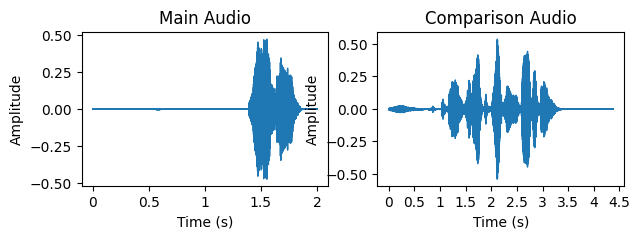

Emotion found: happy
Playing interval: 1 of transcript id: '162469'...
out-3003958667-994-20240405-163905-1712353145.162469.WAV
duration:  5.155333333333333 min


Emotion found: angry
Playing interval: 2 of transcript id: '162469'...
out-3003958667-994-20240405-163905-1712353145.162469.WAV
duration:  5.155333333333333 min


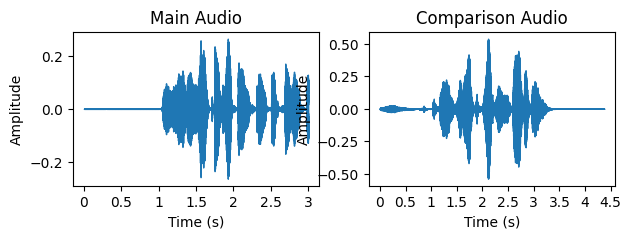

Emotion found: happy
Playing interval: 3 of transcript id: '162469'...
out-3003958667-994-20240405-163905-1712353145.162469.WAV
duration:  5.155333333333333 min


Intervals Speaker 1 

Emotion found: angry
Playing interval: 0 of transcript id: '162469'...
out-3003958667-994-20240405-163905-1712353145.162469.WAV
duration:  5.155333333333333 min


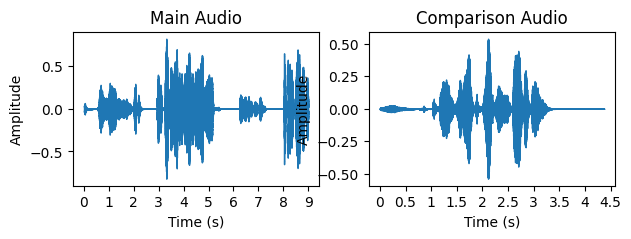

Emotion found: angry
Playing interval: 1 of transcript id: '162469'...
out-3003958667-994-20240405-163905-1712353145.162469.WAV
duration:  5.155333333333333 min


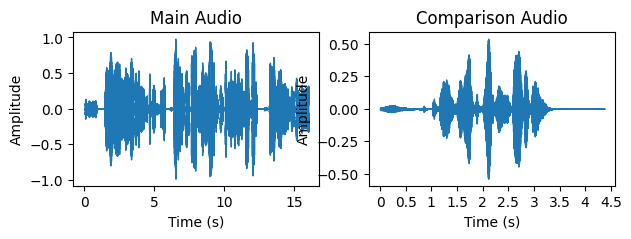

Emotion found: angry
Playing interval: 2 of transcript id: '162469'...
out-3003958667-994-20240405-163905-1712353145.162469.WAV
duration:  5.155333333333333 min


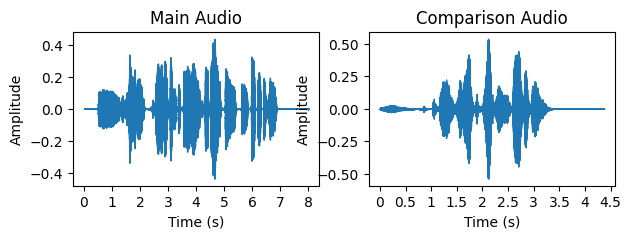

Emotion found: angry
Playing interval: 3 of transcript id: '162469'...
out-3003958667-994-20240405-163905-1712353145.162469.WAV
duration:  5.155333333333333 min


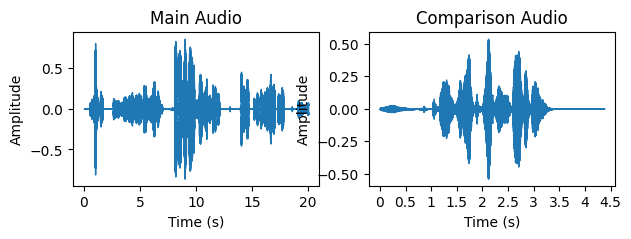

Emotion found: happy
Playing interval: 4 of transcript id: '162469'...
out-3003958667-994-20240405-163905-1712353145.162469.WAV
duration:  5.155333333333333 min


Emotion found: angry
Playing interval: 5 of transcript id: '162469'...
out-3003958667-994-20240405-163905-1712353145.162469.WAV
duration:  5.155333333333333 min


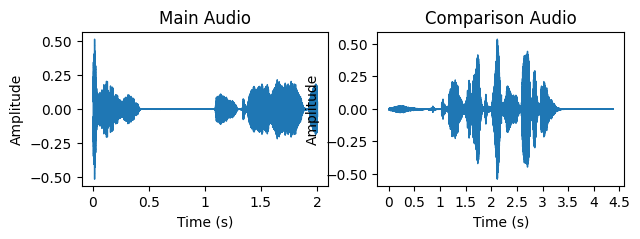

Emotion found: angry
Playing interval: 6 of transcript id: '162469'...
out-3003958667-994-20240405-163905-1712353145.162469.WAV
duration:  5.155333333333333 min


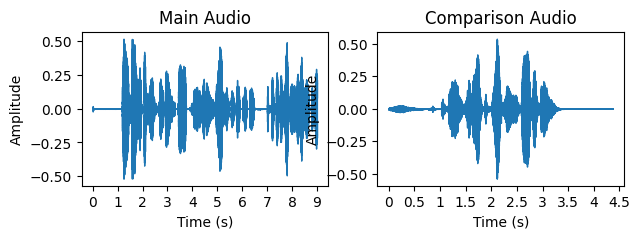

Emotion found: angry
Playing interval: 7 of transcript id: '162469'...
out-3003958667-994-20240405-163905-1712353145.162469.WAV
duration:  5.155333333333333 min


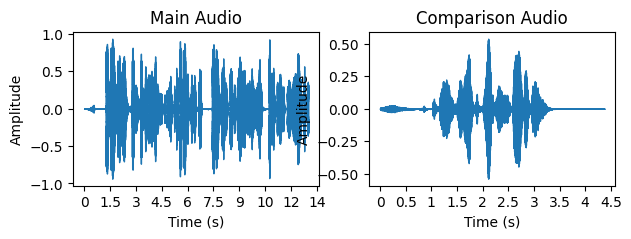

Emotion found: happy
Playing interval: 8 of transcript id: '162469'...
out-3003958667-994-20240405-163905-1712353145.162469.WAV
duration:  5.155333333333333 min


Emotion found: happy
Playing interval: 9 of transcript id: '162469'...
out-3003958667-994-20240405-163905-1712353145.162469.WAV
duration:  5.155333333333333 min


Emotion found: angry
Playing interval: 10 of transcript id: '162469'...
out-3003958667-994-20240405-163905-1712353145.162469.WAV
duration:  5.155333333333333 min


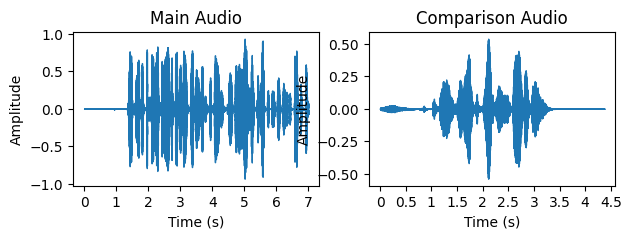

Emotion found: angry
Playing interval: 11 of transcript id: '162469'...
out-3003958667-994-20240405-163905-1712353145.162469.WAV
duration:  5.155333333333333 min


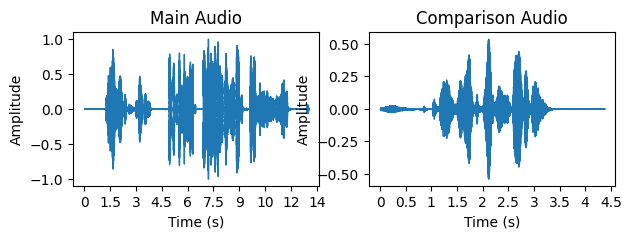

Emotion found: angry
Playing interval: 12 of transcript id: '162469'...
out-3003958667-994-20240405-163905-1712353145.162469.WAV
duration:  5.155333333333333 min


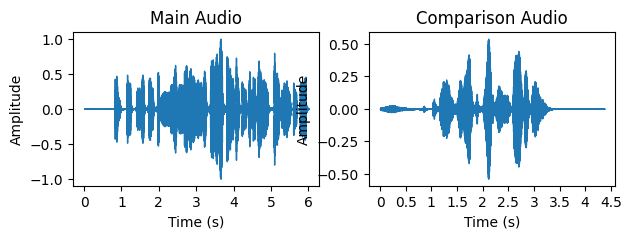

Emotion found: angry
Playing interval: 13 of transcript id: '162469'...
out-3003958667-994-20240405-163905-1712353145.162469.WAV
duration:  5.155333333333333 min


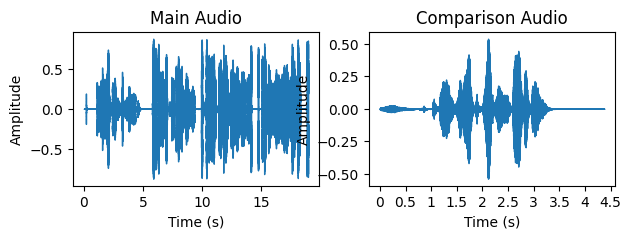

Emotion found: angry
Playing interval: 14 of transcript id: '162469'...
out-3003958667-994-20240405-163905-1712353145.162469.WAV
duration:  5.155333333333333 min


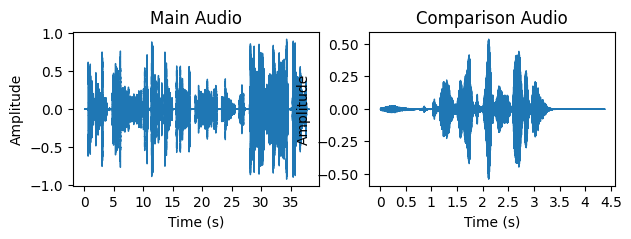

Emotion found: angry
Playing interval: 15 of transcript id: '162469'...
out-3003958667-994-20240405-163905-1712353145.162469.WAV
duration:  5.155333333333333 min


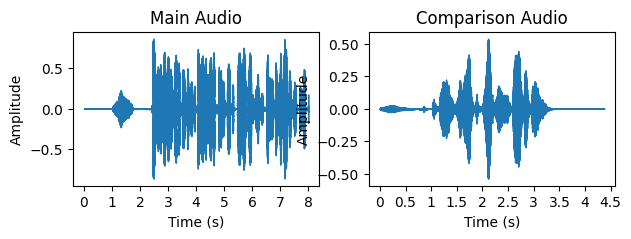

Emotion found: happy
Playing interval: 16 of transcript id: '162469'...
out-3003958667-994-20240405-163905-1712353145.162469.WAV
duration:  5.155333333333333 min


Emotion found: angry
Playing interval: 17 of transcript id: '162469'...
out-3003958667-994-20240405-163905-1712353145.162469.WAV
duration:  5.155333333333333 min


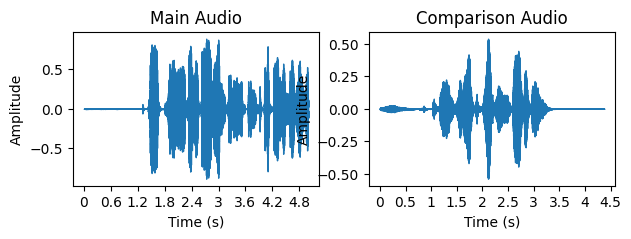

Emotion found: happy
Playing interval: 18 of transcript id: '162469'...
out-3003958667-994-20240405-163905-1712353145.162469.WAV
duration:  5.155333333333333 min


Emotion found: angry
Playing interval: 19 of transcript id: '162469'...
out-3003958667-994-20240405-163905-1712353145.162469.WAV
duration:  5.155333333333333 min


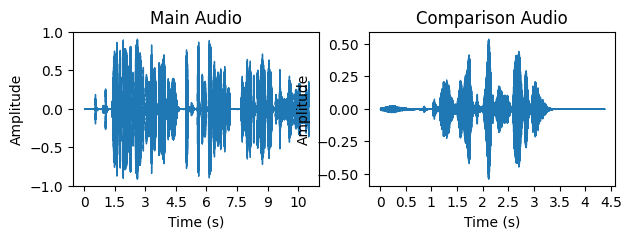

Emotion found: angry
Playing interval: 20 of transcript id: '162469'...
out-3003958667-994-20240405-163905-1712353145.162469.WAV
duration:  5.155333333333333 min


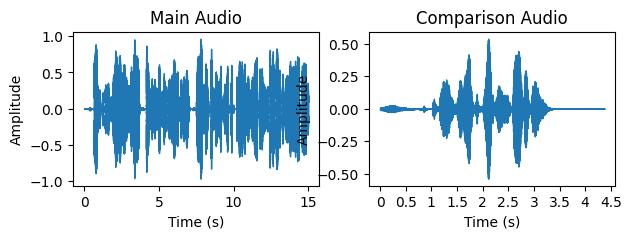

Emotion found: angry
Playing interval: 21 of transcript id: '162469'...
out-3003958667-994-20240405-163905-1712353145.162469.WAV
duration:  5.155333333333333 min


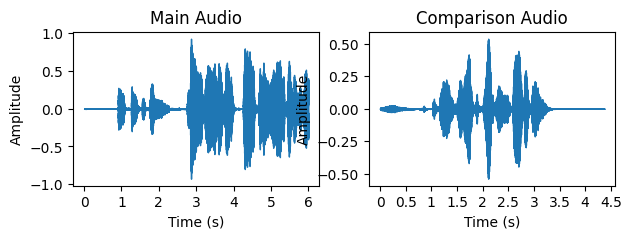

In [30]:
print("Intervals Speaker 0 \n")
for key, interval_dict  in audios_emotions_spk0.items():
  for index, (interval, emotion) in enumerate(interval_dict.items()):
    print(f"Emotion found: {emotion}")
    play_interval(speakers0_times, key, index)
    if interval in angry_spk0[key]:
      plot_waveform_from_array(angry_spk0[key][interval][0], angry_spk0[key][interval][1], '/content/03-01-05-02-01-02-01.wav')

print("Intervals Speaker 1 \n")
for key, interval_dict  in audios_emotions_spk1.items():
  for index, (interval, emotion) in enumerate(interval_dict.items()):
    print(f"Emotion found: {emotion}")
    play_interval(speakers1_times, key, index)
    if interval in angry_spk1[key]:
      plot_waveform_from_array(angry_spk1[key][interval][0], angry_spk1[key][interval][1], '/content/03-01-05-02-01-02-01.wav')